 **Organization needs to enhance its cybersecurity measures by effectively identifying and mitigating phishing attacks. Phishing attacks compromises sensitive information, leads to financial losses, and damages  brand reputation. The goal is to develop a machine learning model that accurately distinguishes between legitimate and phishing websites, thereby protecting users and maintaining the integrity of online services.**

Data source: [link text](https://data.mendeley.com/datasets/72ptz43s9v/1)   Mendeley Data

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.preprocessing import FunctionTransformer,StandardScaler
from sklearn.feature_selection import VarianceThreshold

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
df= pd.read_csv('/content/drive/MyDrive/dataset_full.csv')

In [ ]:
pd.set_option('display.max_columns', None)

#EDA

In [ ]:
df.sample(5)

,qty_dot_url,qty_hyphen_url,qty_underline_url,qty_slash_url,qty_questionmark_url,qty_equal_url,qty_at_url,qty_and_url,qty_exclamation_url,qty_space_url,qty_tilde_url,qty_comma_url,qty_plus_url,qty_asterisk_url,qty_hashtag_url,qty_dollar_url,qty_percent_url,qty_tld_url,length_url,qty_dot_domain,qty_hyphen_domain,qty_underline_domain,qty_slash_domain,qty_questionmark_domain,qty_equal_domain,qty_at_domain,qty_and_domain,qty_exclamation_domain,qty_space_domain,qty_tilde_domain,qty_comma_domain,qty_plus_domain,qty_asterisk_domain,qty_hashtag_domain,qty_dollar_domain,qty_percent_domain,qty_vowels_domain,domain_length,domain_in_ip,server_client_domain,qty_dot_directory,qty_hyphen_directory,qty_underline_directory,qty_slash_directory,qty_questionmark_directory,qty_equal_directory,qty_at_directory,qty_and_directory,qty_exclamation_directory,qty_space_directory,qty_tilde_directory,qty_comma_directory,qty_plus_directory,qty_asterisk_directory,qty_hashtag_directory,qty_dollar_directory,qty_percent_directory,directory_length,qty_dot_file,qty_hyphen_file,qty_underline_file,qty_slash_file,qty_questionmark_file,qty_equal_file,qty_at_file,qty_and_file,qty_exclamation_file,qty_space_file,qty_tilde_file,qty_comma_file,qty_plus_file,qty_asterisk_file,qty_hashtag_file,qty_dollar_file,qty_percent_file,file_length,qty_dot_params,qty_hyphen_params,qty_underline_params,qty_slash_params,qty_questionmark_params,qty_equal_params,qty_at_params,qty_and_params,qty_exclamation_params,qty_space_params,qty_tilde_params,qty_comma_params,qty_plus_params,qty_asterisk_params,qty_hashtag_params,qty_dollar_params,qty_percent_params,params_length,tld_present_params,qty_params,email_in_url,time_response,domain_spf,asn_ip,time_domain_activation,time_domain_expiration,qty_ip_resolved,qty_nameservers,qty_mx_servers,ttl_hostname,tls_ssl_certificate,qty_redirects,url_google_index,domain_google_index,url_shortened,phishing
62322,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,18,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,5,18,0,0,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,0,0.581757,1,46606,5929,1375,1,2,1,14392,1,0,0,0,0,0
53811,3,1,0,6,0,0,0,0,0,0,0,0,0,0,0,0,0,1,64,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,7,20,0,0,0,1,0,6,0,0,0,0,0,0,0,0,0,0,0,0,0,44,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,0,1.380122,0,5550,-1,-1,1,2,2,2754,1,0,0,0,0,1
28191,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,18,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,4,18,0,0,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,0,2.469604,1,46606,4141,1702,1,2,1,14386,1,1,0,0,0,0
55968,2,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,1,44,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,6,16,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,28,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,0,0.286152,0,15169,-1,-1,1,4,5,283,1,0,0,0,0,1
27089,2,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,1,47,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,9,28,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,19,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,0,0.242208,0,55053,-1,-1,1,2,1,1641,1,0,0,0,0,0


In [ ]:
df.shape

(87209, 112)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 87209 entries, 0 to 88646
Columns: 112 entries, qty_dot_url to phishing
dtypes: float64(1), int64(111)
memory usage: 75.2 MB


In [ ]:
df.describe()

,qty_dot_url,qty_hyphen_url,qty_underline_url,qty_slash_url,qty_questionmark_url,qty_equal_url,qty_at_url,qty_and_url,qty_exclamation_url,qty_space_url,qty_tilde_url,qty_comma_url,qty_plus_url,qty_asterisk_url,qty_hashtag_url,qty_dollar_url,qty_percent_url,qty_tld_url,length_url,qty_dot_domain,qty_hyphen_domain,qty_underline_domain,qty_slash_domain,qty_questionmark_domain,qty_equal_domain,qty_at_domain,qty_and_domain,qty_exclamation_domain,qty_space_domain,qty_tilde_domain,qty_comma_domain,qty_plus_domain,qty_asterisk_domain,qty_hashtag_domain,qty_dollar_domain,qty_percent_domain,qty_vowels_domain,domain_length,domain_in_ip,server_client_domain,qty_dot_directory,qty_hyphen_directory,qty_underline_directory,qty_slash_directory,qty_questionmark_directory,qty_equal_directory,qty_at_directory,qty_and_directory,qty_exclamation_directory,qty_space_directory,qty_tilde_directory,qty_comma_directory,qty_plus_directory,qty_asterisk_directory,qty_hashtag_directory,qty_dollar_directory,qty_percent_directory,directory_length,qty_dot_file,qty_hyphen_file,qty_underline_file,qty_slash_file,qty_questionmark_file,qty_equal_file,qty_at_file,qty_and_file,qty_exclamation_file,qty_space_file,qty_tilde_file,qty_comma_file,qty_plus_file,qty_asterisk_file,qty_hashtag_file,qty_dollar_file,qty_percent_file,file_length,qty_dot_params,qty_hyphen_params,qty_underline_params,qty_slash_params,qty_questionmark_params,qty_equal_params,qty_at_params,qty_and_params,qty_exclamation_params,qty_space_params,qty_tilde_params,qty_comma_params,qty_plus_params,qty_asterisk_params,qty_hashtag_params,qty_dollar_params,qty_percent_params,params_length,tld_present_params,qty_params,email_in_url,time_response,domain_spf,asn_ip,time_domain_activation,time_domain_expiration,qty_ip_resolved,qty_nameservers,qty_mx_servers,ttl_hostname,tls_ssl_certificate,qty_redirects,url_google_index,domain_google_index,url_shortened,phishing
count,87209.000000,87209.000000,87209.000000,87209.000000,87209.000000,87209.000000,87209.000000,87209.000000,87209.000000,87209.000000,87209.000000,87209.000000,87209.000000,87209.000000,87209.000000,87209.000000,87209.000000,87209.000000,87209.000000,87209.000000,87209.000000,87209.000000,87209.0,87209.0,87209.0,87209.000000,87209.0,87209.0,87209.0,87209.0,87209.0,87209.0,87209.0,87209.0,87209.0,87209.0,87209.000000,87209.000000,87209.000000,87209.000000,87209.000000,87209.000000,87209.000000,87209.000000,87209.000000,87209.000000,87209.000000,87209.000000,87209.000000,87209.000000,87209.000000,87209.000000,87209.000000,87209.000000,87209.000000,87209.000000,87209.000000,87209.000000,87209.000000,87209.000000,87209.000000,87209.000000,87209.000000,87209.000000,87209.000000,87209.000000,87209.000000,87209.000000,87209.000000,87209.000000,87209.000000,87209.000000,87209.000000,87209.000000,87209.000000,87209.000000,87209.000000,87209.000000,87209.000000,87209.000000,87209.000000,87209.000000,87209.000000,87209.000000,87209.000000,87209.000000,87209.000000,87209.000000,87209.000000,87209.000000,87209.000000,87209.000000,87209.000000,87209.000000,87209.000000,87209.000000,87209.000000,87209.000000,87209.000000,87209.000000,87209.000000,87209.000000,87209.000000,87209.000000,87209.000000,87209.000000,87209.000000,87209.00000,87209.000000,87209.000000,87209.000000,87209.000000
mean,2.194189,0.331514,0.115252,1.292688,0.009082,0.206768,0.022383,0.141912,0.002993,0.001032,0.003279,0.001582,0.002798,0.004610,0.000516,0.001926,0.108441,1.048172,36.468897,1.870621,0.115240,0.000768,0.0,0.0,0.0,0.000011,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.449438,18.581832,0.002225,0.004564,-0.316917,-0.354172,-0.472463,0.729260,-0.531172,-0.524006,-0.527732,-0.526586,-0.529521,-0.530370,-0.527950,-0.530587,-0.530083,-0.527411,-0.531172,-0.529842,-0.477829,10.946955,-0.361912,-0.472394,-0.505716,-0.531172,-0.531172,-0.529498,-0.530874,-0.529727,-0.530117,-0.530737,-0.530874,-0.530737,-0.530393,-0.529980,-0.531172,-0.531172,-0.493367,2.789792,-0.809584,-0.877765,-0.860978,-0.88

In [ ]:
numerical_feature = [feature for feature in df.columns if df[feature].dtypes != 'O']
len(numerical_feature)

112

In [ ]:
categorical_features = df.select_dtypes(include=['object', 'category']).columns.tolist()
len(categorical_features)

0

In [ ]:
for feature in numerical_feature:
    print(f"{feature}: {df[feature].nunique()}")

qty_dot_url: 23
qty_hyphen_url: 30
qty_underline_url: 22
qty_slash_url: 25
qty_questionmark_url: 6
qty_equal_url: 20
qty_at_url: 15
qty_and_url: 21
qty_exclamation_url: 10
qty_space_url: 8
qty_tilde_url: 6
qty_comma_url: 8
qty_plus_url: 10
qty_asterisk_url: 18
qty_hashtag_url: 7
qty_dollar_url: 10
qty_percent_url: 52
qty_tld_url: 9
length_url: 453
qty_dot_domain: 19
qty_hyphen_domain: 12
qty_underline_domain: 4
qty_slash_domain: 1
qty_questionmark_domain: 1
qty_equal_domain: 1
qty_at_domain: 2
qty_and_domain: 1
qty_exclamation_domain: 1
qty_space_domain: 1
qty_tilde_domain: 1
qty_comma_domain: 1
qty_plus_domain: 1
qty_asterisk_domain: 1
qty_hashtag_domain: 1
qty_dollar_domain: 1
qty_percent_domain: 1
qty_vowels_domain: 42
domain_length: 94
domain_in_ip: 2
server_client_domain: 2
qty_dot_directory: 16
qty_hyphen_directory: 24
qty_underline_directory: 18
qty_slash_directory: 20
qty_questionmark_directory: 2
qty_equal_directory: 7
qty_at_directory: 13
qty_and_directory: 14
qty_exclamation

<ipython-input-62-a3995c7fca9a>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(7,5))


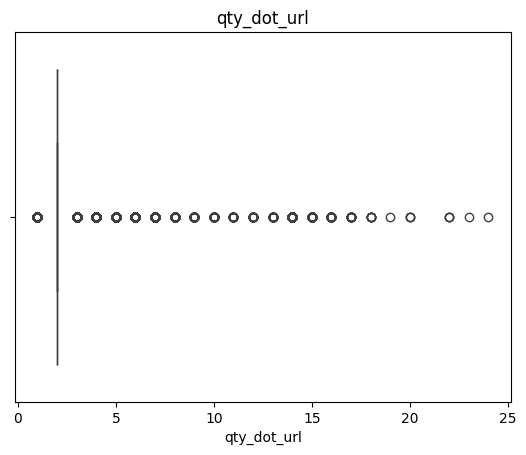

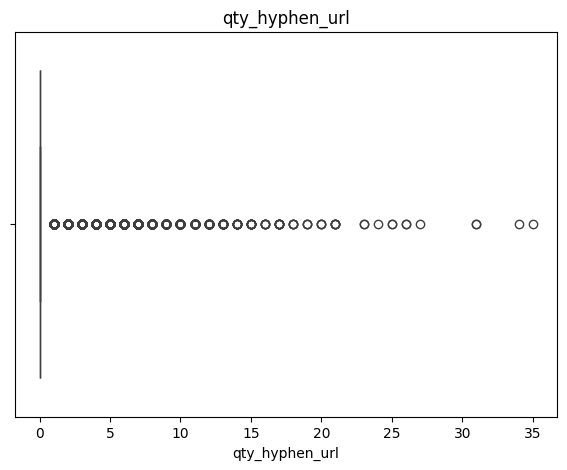

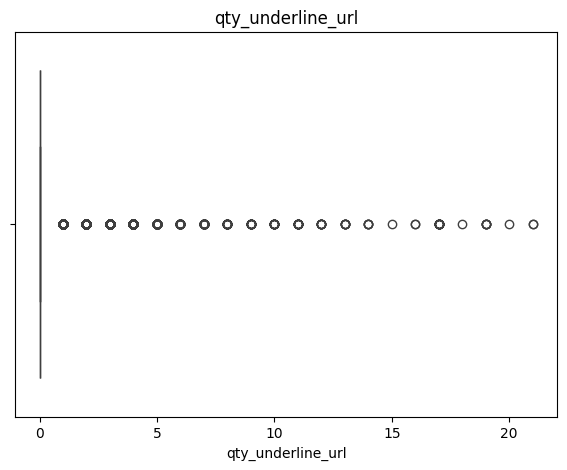

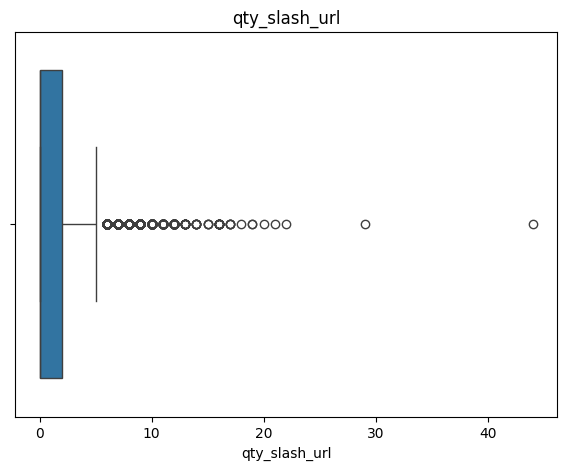

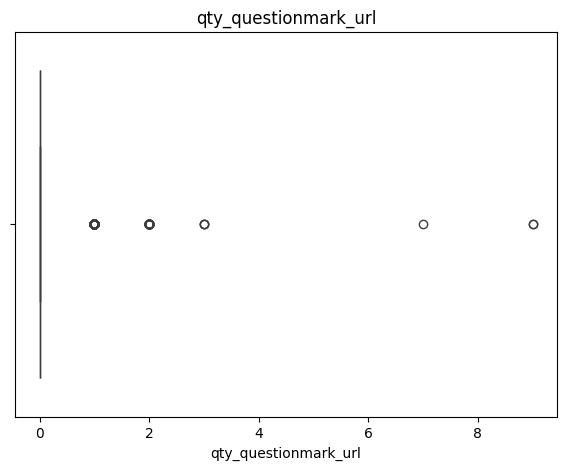

...

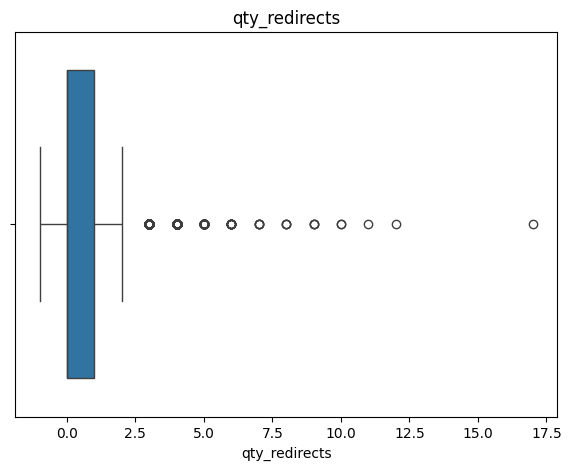

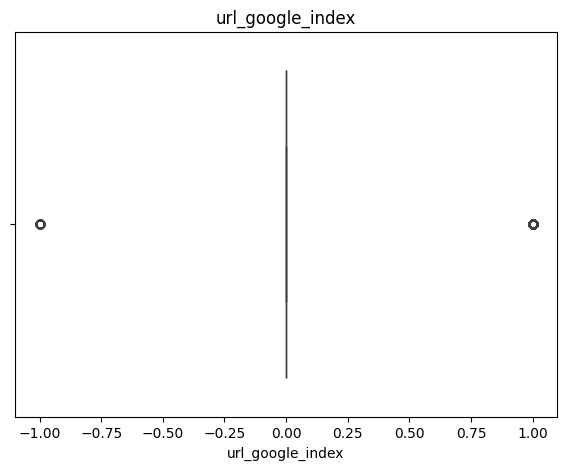

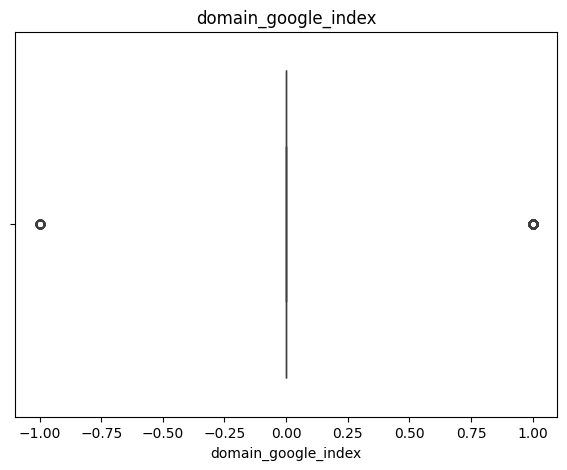

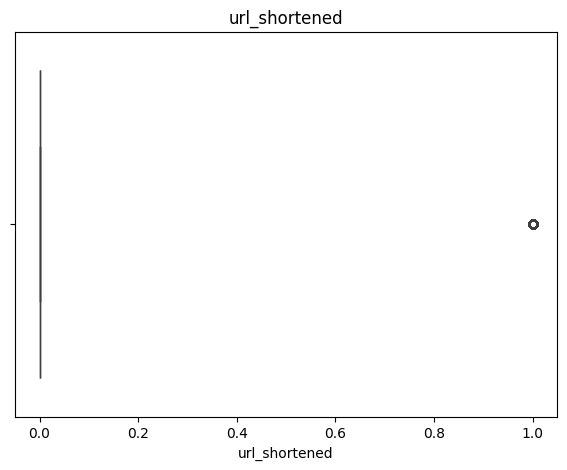

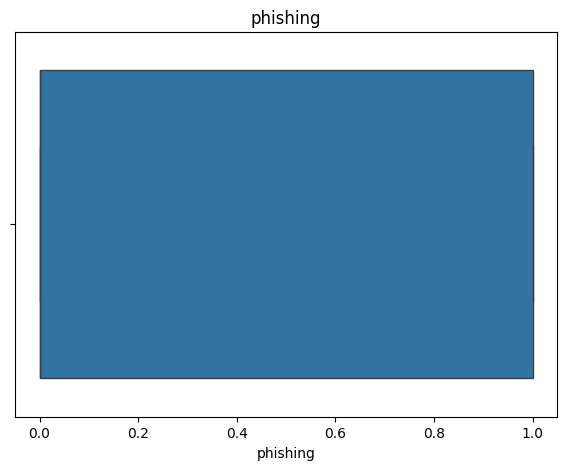

<Figure size 700x500 with 0 Axes>

In [ ]:
#Checking outliers of numerical features
for feature in numerical_feature:
    data=df.copy()
    sns.boxplot(x=data[feature])
    plt.title(feature)
    plt.figure(figsize=(7,5))

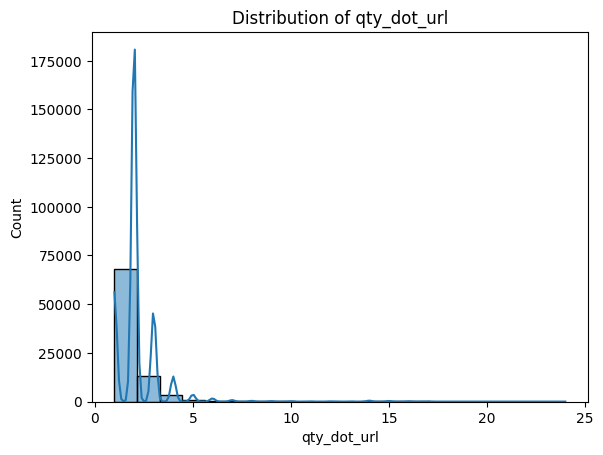

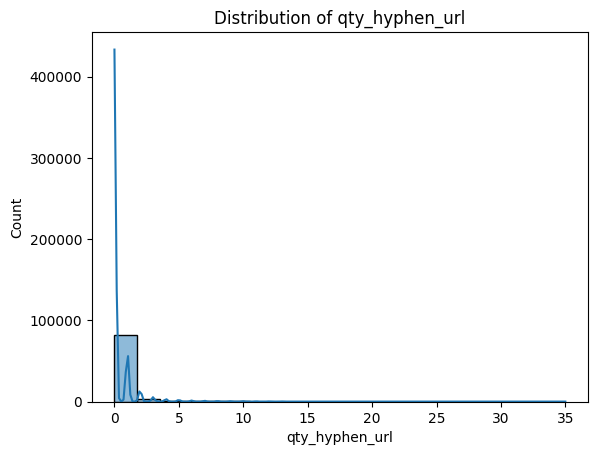

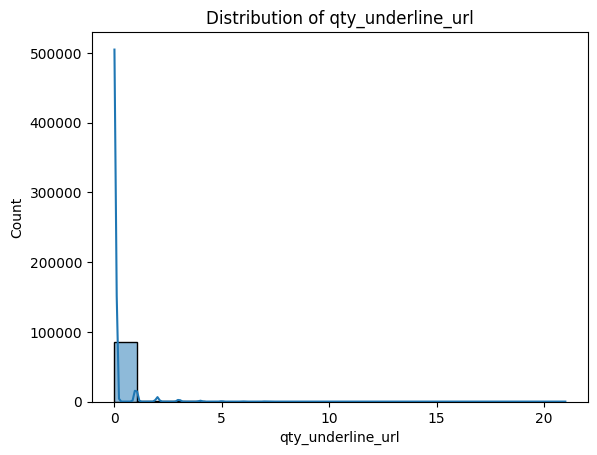

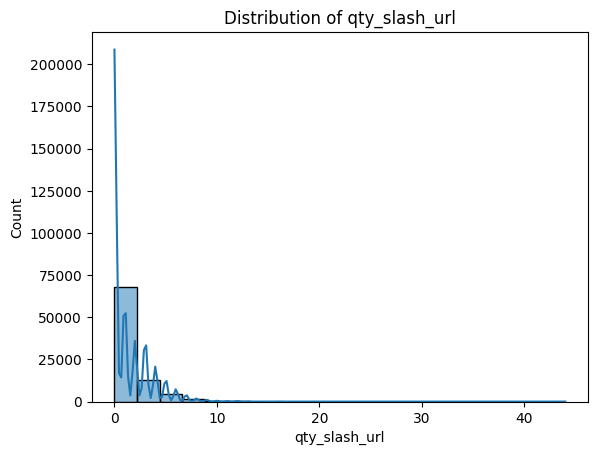

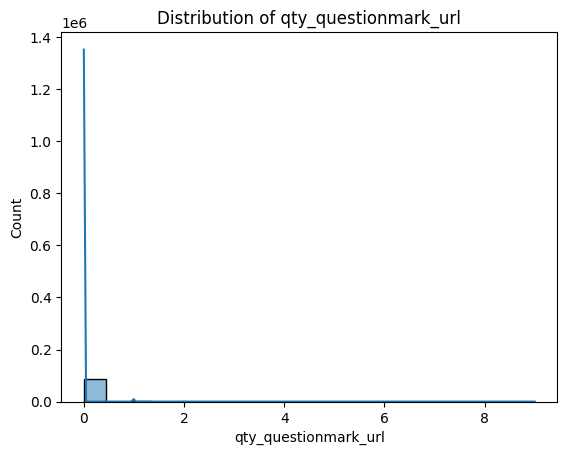

...

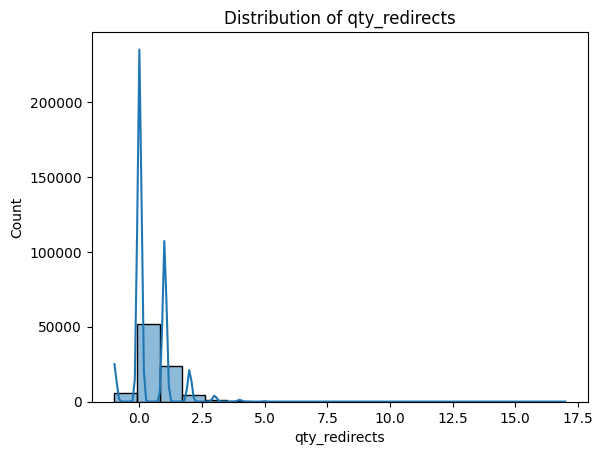

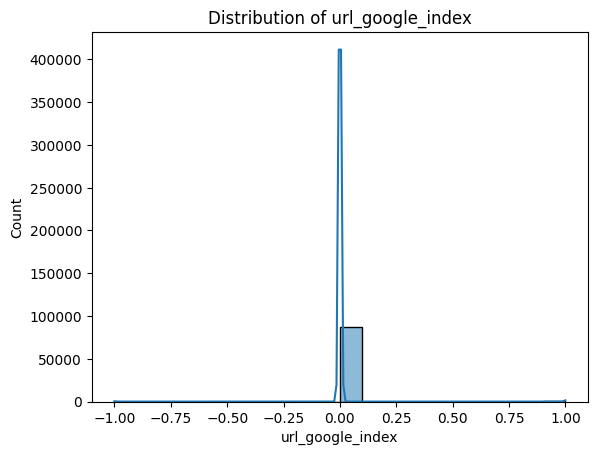

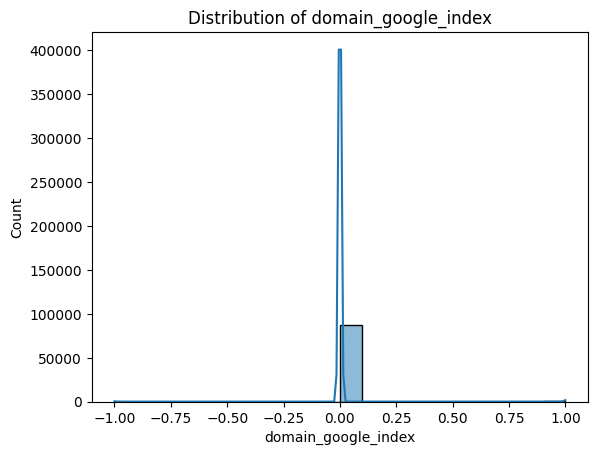

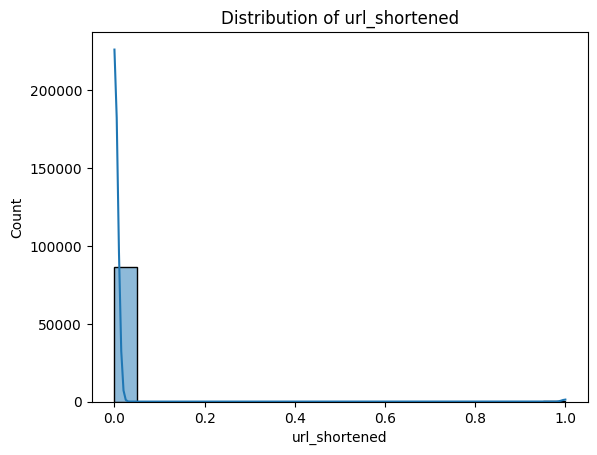

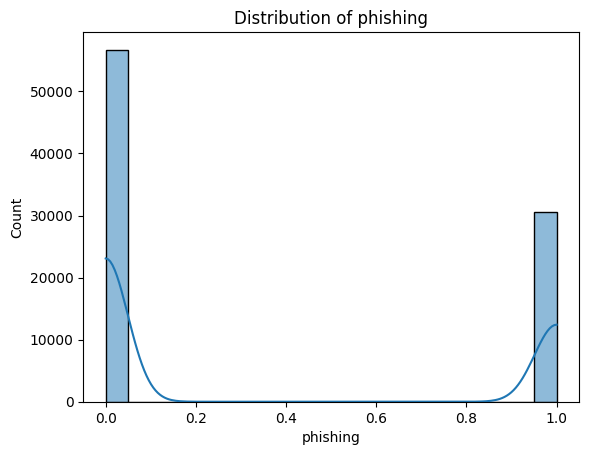

In [ ]:
#Checking the distribution of numerical features
for feature in numerical_feature:
    plt.figure()
    sns.histplot(df[feature], bins=20, kde=True, edgecolor='black')
    plt.title(f'Distribution of {feature}')
    plt.show()

In [ ]:
for feature in numerical_feature:
  skewness = df[feature].skew()
  print(f"Skewness of {feature}: {skewness}")

Skewness of qty_dot_url: 5.490946758267979
Skewness of qty_hyphen_url: 8.019793852872343
Skewness of qty_underline_url: 12.677987606947768
Skewness of qty_slash_url: 2.0370987290289473
Skewness of qty_questionmark_url: 23.921856268523552
Skewness of qty_equal_url: 7.352046142456539
Skewness of qty_at_url: 90.85246029377912
Skewness of qty_and_url: 9.545147006930645
Skewness of qty_exclamation_url: 64.53855562045709
Skewness of qty_space_url: 97.46906123196814
Skewness of qty_tilde_url: 36.57402039960525
Skewness of qty_comma_url: 81.13964652475742
Skewness of qty_plus_url: 87.48101673133087
Skewness of qty_asterisk_url: 119.33197383686931
Skewness of qty_hashtag_url: 160.81328341441613
Skewness of qty_dollar_url: 70.53522975062444
Skewness of qty_percent_url: 42.699903178603876
Skewness of qty_tld_url: 6.2687276809397146
Skewness of length_url: 14.12670163675859
Skewness of qty_dot_domain: 2.632643416555297
Skewness of qty_hyphen_domain: 5.985189069610965
Skewness of qty_underline_doma

###Outliers and skewness is observed.

In [ ]:
df['phishing'].value_counts()

phishing
0    58000
1    30647
Name: count, dtype: int64

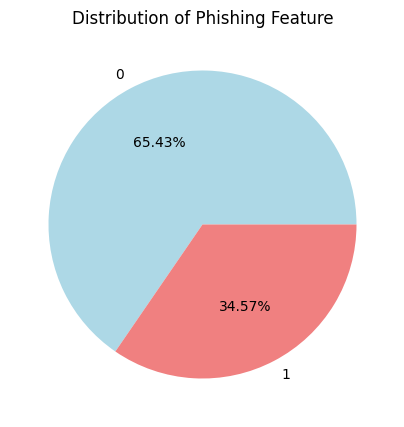

In [ ]:
z=df['phishing'].value_counts()
plt.figure(figsize=(5, 5))
plt.pie(z, labels=z.index,colors=['lightblue', 'lightcoral'],autopct='%1.2f%%')
plt.title('Distribution of Phishing Feature')
plt.show()

###Dataset is slightly imbalanced, but can be worked with.

In [ ]:
df.isnull().sum()

qty_dot_url             0
qty_hyphen_url          0
qty_underline_url       0
qty_slash_url           0
qty_questionmark_url    0
                       ..
qty_redirects           0
url_google_index        0
domain_google_index     0
url_shortened           0
phishing                0
Length: 112, dtype: int64

In [ ]:
check_null=[feature for feature in df.columns if df[feature].isnull().sum()>0]
check_null

[]

In [ ]:
df.duplicated().sum()

1438

In [ ]:
df.drop_duplicates(inplace=True)

In [ ]:
X=df.drop('phishing',axis=1)
y=df['phishing']

In [ ]:
#Splitting the data before pre-processing to avoid data leakage
X_train,X_test,y_train,y_test  = train_test_split(X,y,test_size=0.30,random_state=44)

In [ ]:
#Step 1 for pipeline
# Creating the Iterative Imputer
iter_imputer = IterativeImputer()

# Fitting and transforming on the training set, and transforming on the test set
X_train_imputed = pd.DataFrame(iter_imputer.fit_transform(X_train), columns=X_train.columns)
X_test_imputed = pd.DataFrame(iter_imputer.transform(X_test), columns=X_test.columns)

In [ ]:
#Step 2 for pipeline
def cap_outliers(df):
    for column in df.select_dtypes(include=np.number).columns:
        Q1 = df[column].quantile(0.25)
        Q3 = df[column].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        df[column] = np.where(df[column] < lower_bound, lower_bound, df[column])
        df[column] = np.where(df[column] > upper_bound, upper_bound, df[column])
    return df

# Applying the outlier capping to the training and test set
X_train_capped = cap_outliers(X_train_imputed.copy())
X_test_capped = cap_outliers(X_test_imputed.copy())

In [ ]:
numerical_feature = X_train_capped.select_dtypes(include=np.number).columns # Selects all numerical columns

for feature in numerical_feature:
  skewness = X_train_capped[feature].skew()
  print(f"Skewness of {feature}: {skewness}")

Skewness of qty_dot_url: 0
Skewness of qty_hyphen_url: 0
Skewness of qty_underline_url: 0
Skewness of qty_slash_url: 1.1483635259761684
Skewness of qty_questionmark_url: 0
Skewness of qty_equal_url: 0
Skewness of qty_at_url: 0
Skewness of qty_and_url: 0
Skewness of qty_exclamation_url: 0
Skewness of qty_space_url: 0
Skewness of qty_tilde_url: 0
Skewness of qty_comma_url: 0
Skewness of qty_plus_url: 0
Skewness of qty_asterisk_url: 0
Skewness of qty_hashtag_url: 0
Skewness of qty_dollar_url: 0
Skewness of qty_percent_url: 0
Skewness of qty_tld_url: 0
Skewness of length_url: 1.1621566189506645
Skewness of qty_dot_domain: 0.24153866340701283
Skewness of qty_hyphen_domain: 0
Skewness of qty_underline_domain: 0
Skewness of qty_slash_domain: 0
Skewness of qty_questionmark_domain: 0
Skewness of qty_equal_domain: 0
Skewness of qty_at_domain: 0
Skewness of qty_and_domain: 0
Skewness of qty_exclamation_domain: 0
Skewness of qty_space_domain: 0
Skewness of qty_tilde_domain: 0
Skewness of qty_comma

<ipython-input-68-c56a9f8335a9>:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(7,5))


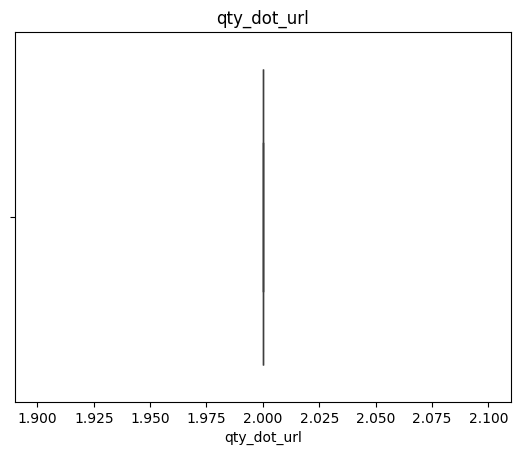

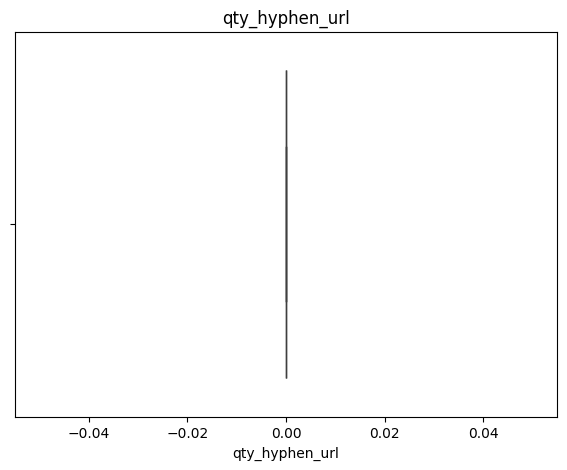

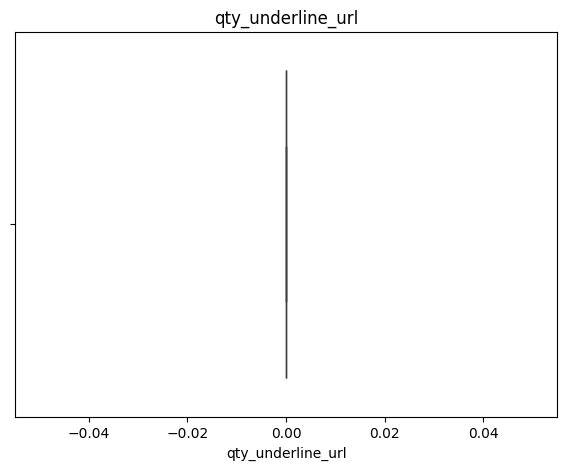

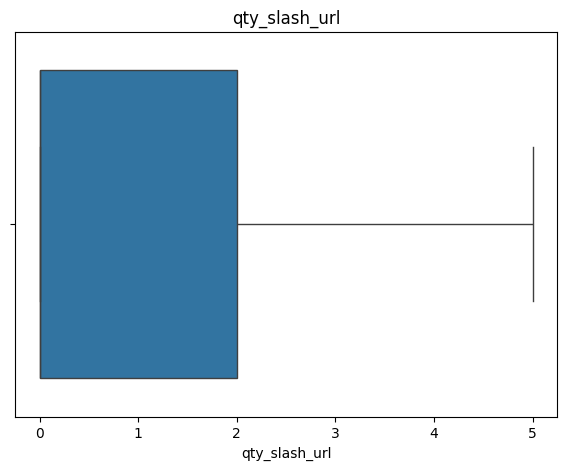

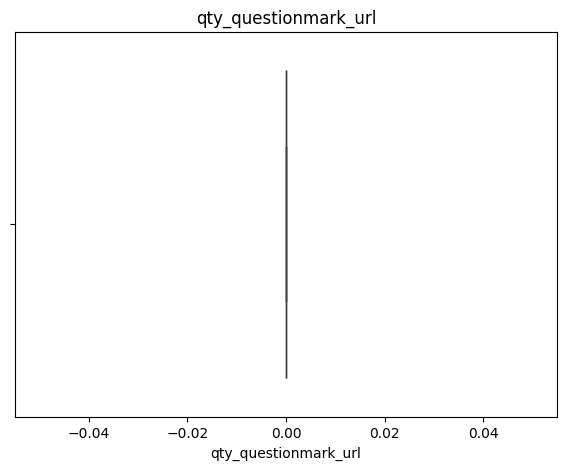

...

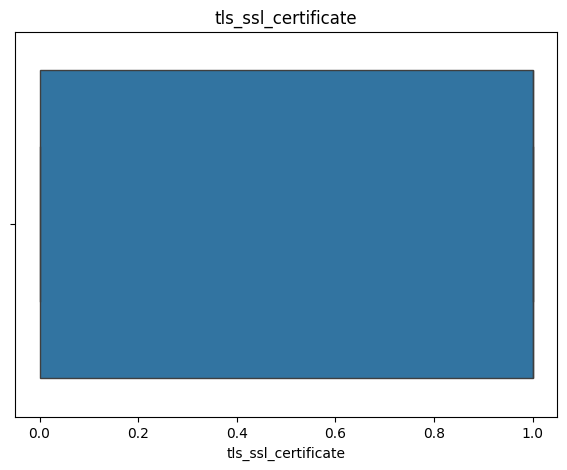

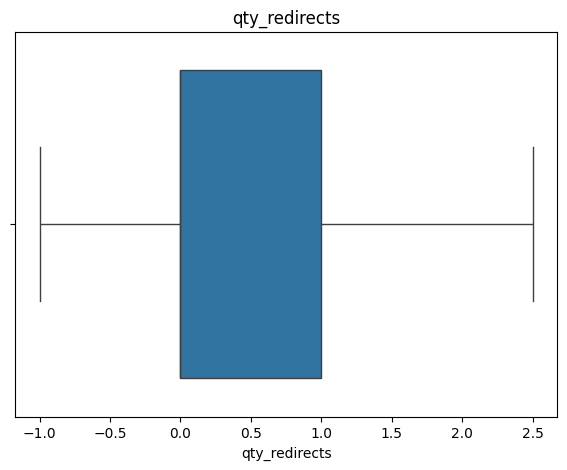

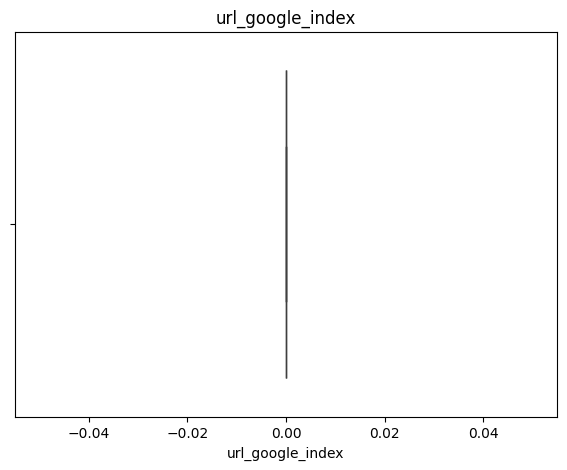

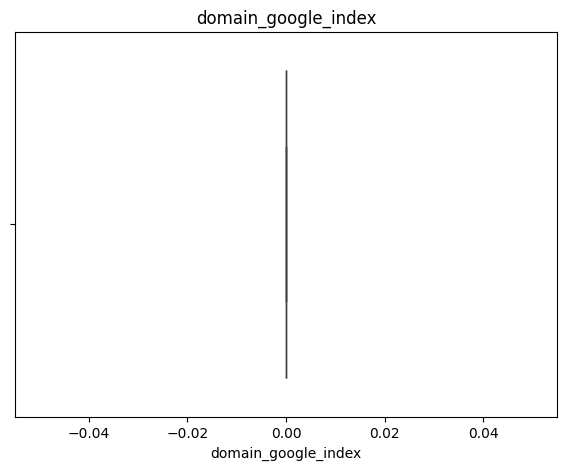

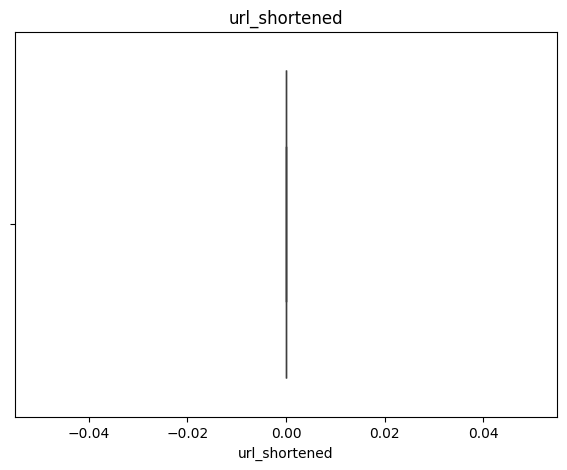

<Figure size 700x500 with 0 Axes>

In [ ]:
numerical_feature = X_train_capped.select_dtypes(include=np.number).columns # Selects all numerical columns


for feature in numerical_feature:
    data=X_train_capped.copy()
    sns.boxplot(x=data[feature])
    plt.title(feature)
    plt.figure(figsize=(7,5))

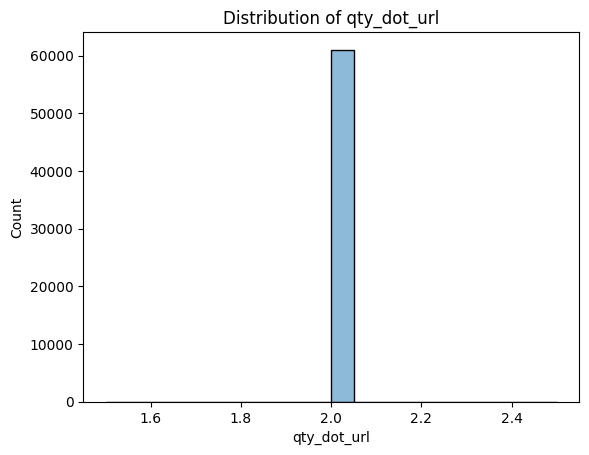

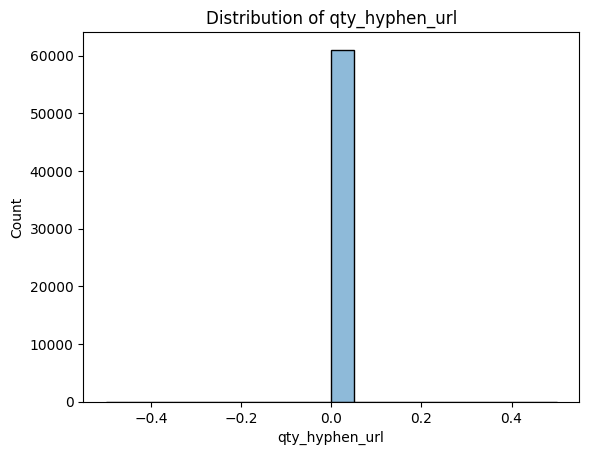

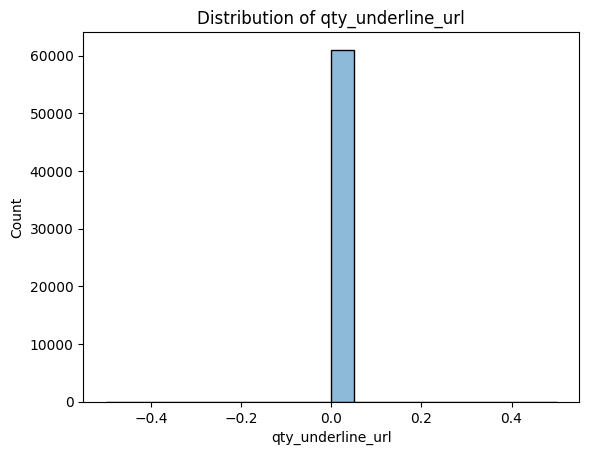

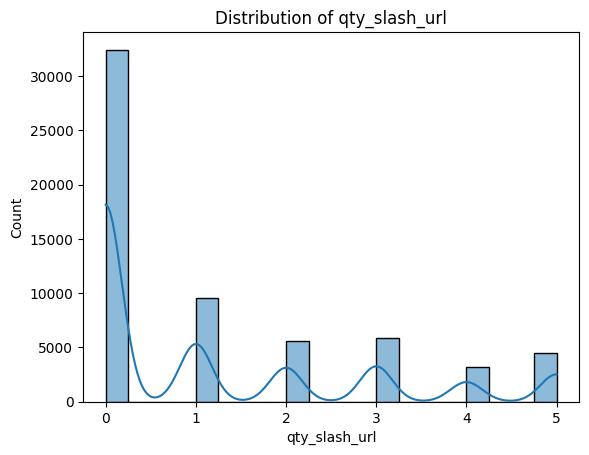

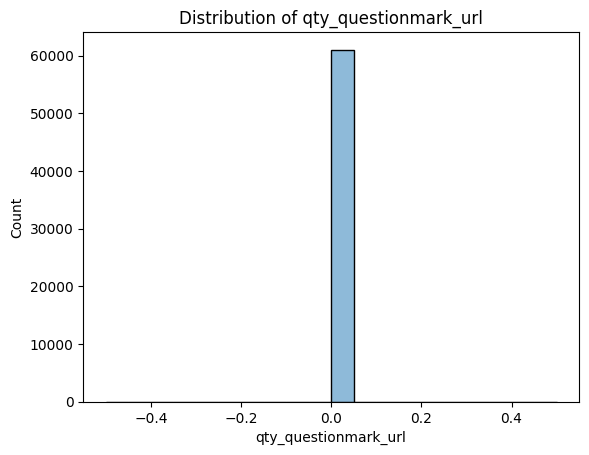

...

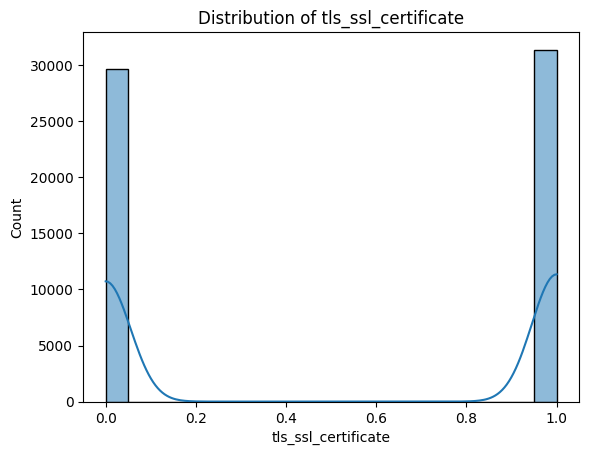

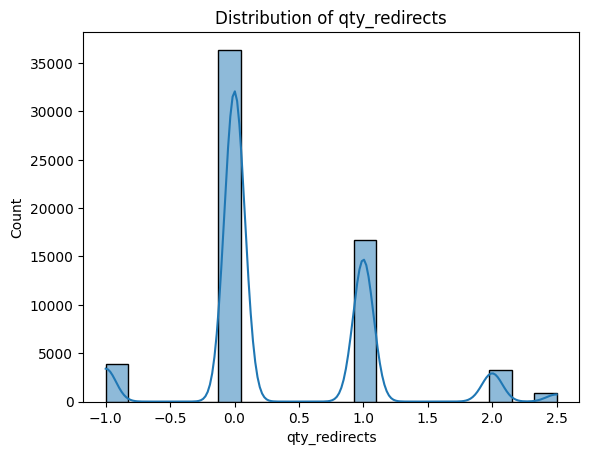

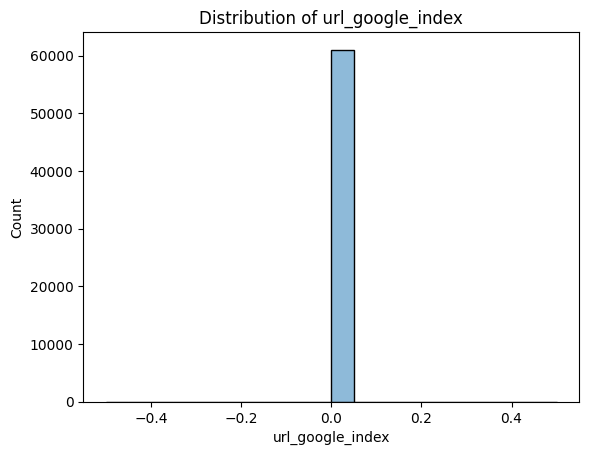

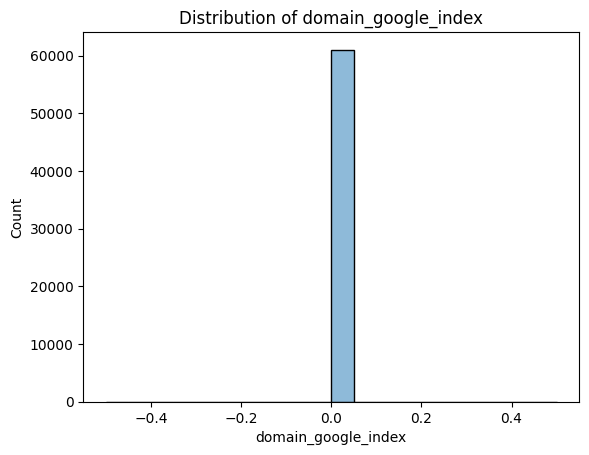

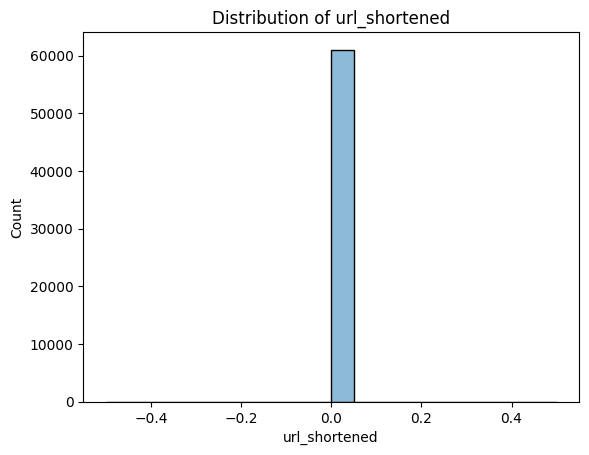

In [ ]:
numerical_feature = X_train_capped.select_dtypes(include=np.number).columns # Selects all numerical columns


for feature in numerical_feature:
    plt.figure()
    sns.histplot(X_train_capped[feature], bins=20, kde=True, edgecolor='black')
    plt.title(f'Distribution of {feature}')
    plt.show()

###Skewness has been battled as data is almost normally distributed now and outliers have been removed

In [ ]:
X_train_capped.describe()

,qty_dot_url,qty_hyphen_url,qty_underline_url,qty_slash_url,qty_questionmark_url,qty_equal_url,qty_at_url,qty_and_url,qty_exclamation_url,qty_space_url,qty_tilde_url,qty_comma_url,qty_plus_url,qty_asterisk_url,qty_hashtag_url,qty_dollar_url,qty_percent_url,qty_tld_url,length_url,qty_dot_domain,qty_hyphen_domain,qty_underline_domain,qty_slash_domain,qty_questionmark_domain,qty_equal_domain,qty_at_domain,qty_and_domain,qty_exclamation_domain,qty_space_domain,qty_tilde_domain,qty_comma_domain,qty_plus_domain,qty_asterisk_domain,qty_hashtag_domain,qty_dollar_domain,qty_percent_domain,qty_vowels_domain,domain_length,domain_in_ip,server_client_domain,qty_dot_directory,qty_hyphen_directory,qty_underline_directory,qty_slash_directory,qty_questionmark_directory,qty_equal_directory,qty_at_directory,qty_and_directory,qty_exclamation_directory,qty_space_directory,qty_tilde_directory,qty_comma_directory,qty_plus_directory,qty_asterisk_directory,qty_hashtag_directory,qty_dollar_directory,qty_percent_directory,directory_length,qty_dot_file,qty_hyphen_file,qty_underline_file,qty_slash_file,qty_questionmark_file,qty_equal_file,qty_at_file,qty_and_file,qty_exclamation_file,qty_space_file,qty_tilde_file,qty_comma_file,qty_plus_file,qty_asterisk_file,qty_hashtag_file,qty_dollar_file,qty_percent_file,file_length,qty_dot_params,qty_hyphen_params,qty_underline_params,qty_slash_params,qty_questionmark_params,qty_equal_params,qty_at_params,qty_and_params,qty_exclamation_params,qty_space_params,qty_tilde_params,qty_comma_params,qty_plus_params,qty_asterisk_params,qty_hashtag_params,qty_dollar_params,qty_percent_params,params_length,tld_present_params,qty_params,email_in_url,time_response,domain_spf,asn_ip,time_domain_activation,time_domain_expiration,qty_ip_resolved,qty_nameservers,qty_mx_servers,ttl_hostname,tls_ssl_certificate,qty_redirects,url_google_index,domain_google_index,url_shortened
count,61046.0,61046.0,61046.0,61046.000000,61046.0,61046.0,61046.0,61046.0,61046.0,61046.0,61046.0,61046.0,61046.0,61046.0,61046.0,61046.0,61046.0,61046.0,61046.000000,61046.000000,61046.0,61046.0,61046.0,61046.0,61046.0,61046.0,61046.0,61046.0,61046.0,61046.0,61046.0,61046.0,61046.0,61046.0,61046.0,61046.0,61046.000000,61046.000000,61046.0,61046.0,61046.000000,61046.000000,61046.000000,61046.000000,61046.000000,61046.000000,61046.000000,61046.000000,61046.000000,61046.000000,61046.000000,61046.000000,61046.000000,61046.000000,61046.000000,61046.000000,61046.000000,61046.000000,61046.000000,61046.000000,61046.000000,61046.000000,61046.000000,61046.000000,61046.000000,61046.000000,61046.000000,61046.000000,61046.000000,61046.000000,61046.000000,61046.000000,61046.000000,61046.000000,61046.000000,61046.000000,61046.0,61046.0,61046.0,61046.0,61046.0,61046.0,61046.0,61046.0,61046.0,61046.0,61046.0,61046.0,61046.0,61046.0,61046.0,61046.0,61046.0,61046.0,61046.0,61046.0,61046.0,61046.000000,61046.0,61046.000000,61046.000000,61046.000000,61046.0,61046.000000,61046.000000,61046.000000,61046.000000,61046.000000,61046.0,61046.0,61046.0
mean,2.0,0.0,0.0,1.203109,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,30.259542,1.852562,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.394817,18.402958,0.0,0.0,-0.347386,-0.431658,-0.488591,0.697646,-0.531304,-0.524940,-0.529617,-0.528634,-0.530010,-0.531026,-0.528757,-0.530903,-0.530895,-0.530575,-0.531304,-0.530854,-0.518937,8.950333,-0.367166,-0.505611,-0.514489,-0.531304,-0.531304,-0.529920,-0.530968,-0.529945,-0.530313,-0.531124,-0.531116,-0.531050,-0.531050,-0.531165,-0.531304,-0.531304,-0.525907,-0.162697,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,0.0,0.613304,0.0,25721.829645,3437.031779,260.167357,1.0,2.739623,1.489156,5618.454821,0.514202,0.352472,0.0,0.0,0.0
std,0.0,0.0,0.0,1.616924,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,18.916495,0.613340,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.339172,5.708573,0.0,0.0

In [ ]:
#Step 3 for pipeline
# Creating the Standard Scaler
scaler = StandardScaler()

# Fitting on the training set, and transforming both training and test set
X_train_scaled = pd.DataFrame(scaler.fit_transform(X_train_capped), columns=X_train_capped.columns)
X_test_scaled = pd.DataFrame(scaler.transform(X_test_capped), columns=X_test_capped.columns)

In [ ]:
X_train_scaled.describe()

,qty_dot_url,qty_hyphen_url,qty_underline_url,qty_slash_url,qty_questionmark_url,qty_equal_url,qty_at_url,qty_and_url,qty_exclamation_url,qty_space_url,qty_tilde_url,qty_comma_url,qty_plus_url,qty_asterisk_url,qty_hashtag_url,qty_dollar_url,qty_percent_url,qty_tld_url,length_url,qty_dot_domain,qty_hyphen_domain,qty_underline_domain,qty_slash_domain,qty_questionmark_domain,qty_equal_domain,qty_at_domain,qty_and_domain,qty_exclamation_domain,qty_space_domain,qty_tilde_domain,qty_comma_domain,qty_plus_domain,qty_asterisk_domain,qty_hashtag_domain,qty_dollar_domain,qty_percent_domain,qty_vowels_domain,domain_length,domain_in_ip,server_client_domain,qty_dot_directory,qty_hyphen_directory,qty_underline_directory,qty_slash_directory,qty_questionmark_directory,qty_equal_directory,qty_at_directory,qty_and_directory,qty_exclamation_directory,qty_space_directory,qty_tilde_directory,qty_comma_directory,qty_plus_directory,qty_asterisk_directory,qty_hashtag_directory,qty_dollar_directory,qty_percent_directory,directory_length,qty_dot_file,qty_hyphen_file,qty_underline_file,qty_slash_file,qty_questionmark_file,qty_equal_file,qty_at_file,qty_and_file,qty_exclamation_file,qty_space_file,qty_tilde_file,qty_comma_file,qty_plus_file,qty_asterisk_file,qty_hashtag_file,qty_dollar_file,qty_percent_file,file_length,qty_dot_params,qty_hyphen_params,qty_underline_params,qty_slash_params,qty_questionmark_params,qty_equal_params,qty_at_params,qty_and_params,qty_exclamation_params,qty_space_params,qty_tilde_params,qty_comma_params,qty_plus_params,qty_asterisk_params,qty_hashtag_params,qty_dollar_params,qty_percent_params,params_length,tld_present_params,qty_params,email_in_url,time_response,domain_spf,asn_ip,time_domain_activation,time_domain_expiration,qty_ip_resolved,qty_nameservers,qty_mx_servers,ttl_hostname,tls_ssl_certificate,qty_redirects,url_google_index,domain_google_index,url_shortened
count,61046.0,61046.0,61046.0,6.104600e+04,61046.0,61046.0,61046.0,61046.0,61046.0,61046.0,61046.0,61046.0,61046.0,61046.0,61046.0,61046.0,61046.0,61046.0,6.104600e+04,6.104600e+04,61046.0,61046.0,61046.0,61046.0,61046.0,61046.0,61046.0,61046.0,61046.0,61046.0,61046.0,61046.0,61046.0,61046.0,61046.0,61046.0,6.104600e+04,6.104600e+04,61046.0,61046.0,6.104600e+04,6.104600e+04,6.104600e+04,6.104600e+04,6.104600e+04,6.104600e+04,6.104600e+04,6.104600e+04,6.104600e+04,6.104600e+04,6.104600e+04,6.104600e+04,6.104600e+04,6.104600e+04,6.104600e+04,6.104600e+04,6.104600e+04,6.104600e+04,6.104600e+04,6.104600e+04,6.104600e+04,6.104600e+04,6.104600e+04,6.104600e+04,6.104600e+04,6.104600e+04,6.104600e+04,6.104600e+04,6.104600e+04,6.104600e+04,6.104600e+04,6.104600e+04,6.104600e+04,6.104600e+04,6.104600e+04,6.104600e+04,61046.0,61046.0,61046.0,61046.0,61046.0,61046.0,61046.0,61046.0,61046.0,61046.0,61046.0,61046.0,61046.0,61046.0,61046.0,61046.0,61046.0,61046.0,61046.0,61046.0,61046.0,6.104600e+04,61046.0,6.104600e+04,6.104600e+04,6.104600e+04,61046.0,6.104600e+04,6.104600e+04,6.104600e+04,6.104600e+04,6.104600e+04,61046.0,61046.0,61046.0
mean,0.0,0.0,0.0,-7.006957e-17,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.248404e-17,1.601590e-16,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.070831e-17,1.517786e-16,0.0,0.0,-6.896383e-17,-1.065011e-16,9.649116e-17,5.581123e-17,8.421152e-17,5.429810e-17,-1.290817e-16,-1.435728e-16,-1.617886e-17,1.186061e-16,1.658624e-17,9.259194e-17,4.196027e-17,3.544217e-17,8.421152e-17,-8.496809e-18,-1.454933e-17,-6.448263e-17,5.051527e-17,2.968063e-17,1.104585e-16,8.421152e-17,8.421152e-17,3.602414e-17,3.433642e-17,-9.695674e-17,-8.252380e-17,-1.932151e-17,-2.205678e-17,4.545211e-17,7.740244e-17,1.911200e-16,8.421152e-17,8.421152e-17,3.206672e-17,-3.631513e-17,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-6.471542e-17,0.0,6.401705e-17,5.423990e-17,6.518100e-18,0.0,1.954266e-16,-1.179078e-16,-3.771186e-17,-1.415359e-16,-2.327893e-17,0.0,0.0,0.0
std,0.0,0.0,0.0,1.000008e+00,0.0,0.0,

In [ ]:
#When your dataset includes features that have vastly different ranges, standardization ensures that no single
#feature dominates the model simply because of its scale.

#Numeric Data: The features to be standardized should be numeric. Non-numeric data should be converted to a numeric
#format, typically using techniques such as one-hot encoding for categorical data.

#Continuous Data: While the scaler can technically be applied to any numeric data, it works best with continuous data.
#Using it with binary or ordinal data can distort the relationships between categories.

#Gaussian Distribution (Optional): Although not strictly necessary, standardizing features is particularly effective
#when the data is approximately normally distributed. If the data is highly skewed or has outliers, the mean and standard deviation may not be the best summary statistics, and other techniques like robust scaling might be more appropriate.

In [ ]:
X_train_scaled.shape

(61046, 111)

In [ ]:
# Checking constant and quasi-constant columns
constant_filter = VarianceThreshold(threshold=0.05)
constant_filter.fit(X_train_scaled)
constant_columns = X_train_scaled.columns[~constant_filter.get_support()]
print("Constant columns:", ", ".join(constant_columns))
len(constant_columns)

Constant columns: qty_dot_url, qty_hyphen_url, qty_underline_url, qty_questionmark_url, qty_equal_url, qty_at_url, qty_and_url, qty_exclamation_url, qty_space_url, qty_tilde_url, qty_comma_url, qty_plus_url, qty_asterisk_url, qty_hashtag_url, qty_dollar_url, qty_percent_url, qty_tld_url, qty_hyphen_domain, qty_underline_domain, qty_slash_domain, qty_questionmark_domain, qty_equal_domain, qty_at_domain, qty_and_domain, qty_exclamation_domain, qty_space_domain, qty_tilde_domain, qty_comma_domain, qty_plus_domain, qty_asterisk_domain, qty_hashtag_domain, qty_dollar_domain, qty_percent_domain, domain_in_ip, server_client_domain, qty_dot_params, qty_hyphen_params, qty_underline_params, qty_slash_params, qty_questionmark_params, qty_equal_params, qty_at_params, qty_and_params, qty_exclamation_params, qty_space_params, qty_tilde_params, qty_comma_params, qty_plus_params, qty_asterisk_params, qty_hashtag_params, qty_dollar_params, qty_percent_params, params_length, tld_present_params, qty_para

61

In [ ]:
#Step 4 for pipeline
# Creating the Variance Threshold selector
var_thresh = VarianceThreshold(threshold=0.05)

# Fitting on the training set, and transforming both training and test set
X_train_selected = pd.DataFrame(var_thresh.fit_transform(X_train_scaled), columns=X_train_scaled.columns[var_thresh.get_support()])
X_test_selected = pd.DataFrame(var_thresh.transform(X_test_scaled), columns=X_test_scaled.columns[var_thresh.get_support()])

In [ ]:
print(X_train_selected.columns)
print(len(X_train_selected.columns))

Index(['qty_slash_url', 'length_url', 'qty_dot_domain', 'qty_vowels_domain',
       'domain_length', 'qty_dot_directory', 'qty_hyphen_directory',
       'qty_underline_directory', 'qty_slash_directory',
       'qty_questionmark_directory', 'qty_equal_directory', 'qty_at_directory',
       'qty_and_directory', 'qty_exclamation_directory', 'qty_space_directory',
       'qty_tilde_directory', 'qty_comma_directory', 'qty_plus_directory',
       'qty_asterisk_directory', 'qty_hashtag_directory',
       'qty_dollar_directory', 'qty_percent_directory', 'directory_length',
       'qty_dot_file', 'qty_hyphen_file', 'qty_underline_file',
       'qty_slash_file', 'qty_questionmark_file', 'qty_equal_file',
       'qty_at_file', 'qty_and_file', 'qty_exclamation_file', 'qty_space_file',
       'qty_tilde_file', 'qty_comma_file', 'qty_plus_file',
       'qty_asterisk_file', 'qty_hashtag_file', 'qty_dollar_file',
       'qty_percent_file', 'file_length', 'time_response', 'asn_ip',
       'time_domain_

In [ ]:
df_train_preprocessed1 = pd.concat([X_train_selected, y_train.reset_index(drop=True)], axis=1)
df_test_preprocessed1 = pd.concat([X_test_selected, y_test.reset_index(drop=True)], axis=1)

<Axes: >

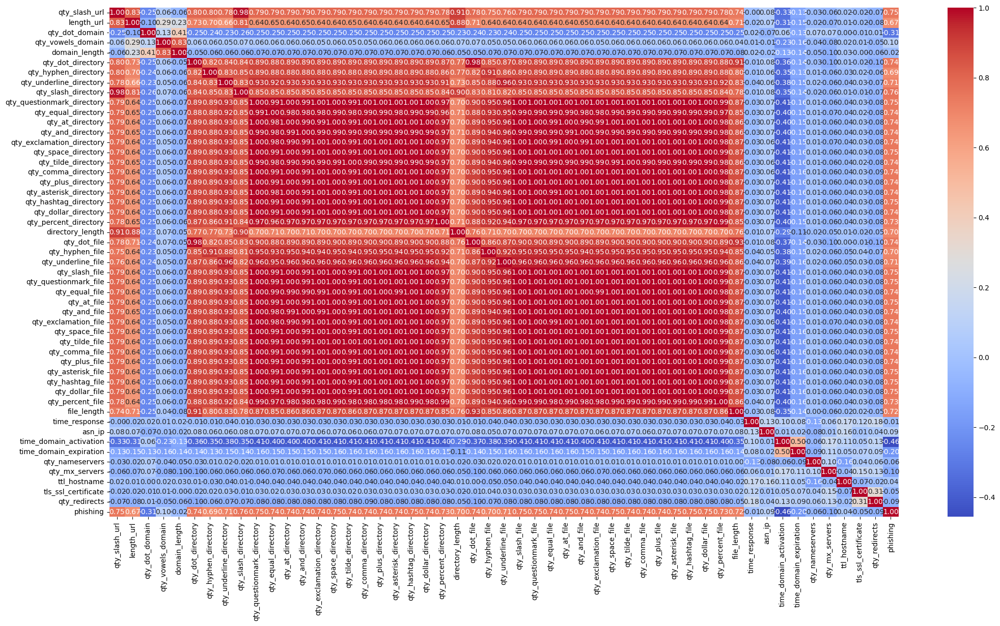

In [ ]:
#Visualizing linear relationships

correlation_matrix = df_train_preprocessed1.corr()
plt.figure(figsize=(25, 13))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")

In [ ]:
#Some tree-based models like Random Forest or XGBoost are less sensitive to
#redundant features compared to linear models.

#In models where feature importance is derived from feature interactions (e.g., ensemble methods),
#redundant features might still contribute valuable interactions.

In [ ]:
#Model comparison, to check which model is likely to perform well

from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.ensemble import GradientBoostingClassifier, RandomForestClassifier, AdaBoostClassifier
from sklearn.metrics import f1_score

# Resetting indices for y_train and y_test to avoid any potential indexing issues
y_train = y_train.reset_index(drop=True)
y_test = y_test.reset_index(drop=True)

# Define classifiers
classifiers = {
    'Logistic Regression': LogisticRegression(),
    'SVM': SVC(),
    'XGBoost': XGBClassifier(),
    'Gradient Boosting': GradientBoostingClassifier(),
    'Random Forest': RandomForestClassifier(),
    'Adaboost': AdaBoostClassifier()
}

# Initialize dictionary to store results
results = {}

# Train and evaluate each classifier
for clf_name, clf in classifiers.items():
    clf.fit(X_train_selected, y_train)
    y_pred = clf.predict(X_test_selected)
    f1 = f1_score(y_test, y_pred)
    results[clf_name] = f1

# Print results
for clf_name, f1 in results.items():
    print(f'{clf_name}: {f1:.4f}')


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Logistic Regression: 0.8957
SVM: 0.9263
XGBoost: 0.9527
Gradient Boosting: 0.9277
Random Forest: 0.9536
Adaboost: 0.9040


#Feature selection and Modelling

##For Random forest

In [ ]:
from sklearn.ensemble import RandomForestClassifier

# Fit the Random Forest model
rf_clf = RandomForestClassifier()
rf_clf.fit(X_train_selected, y_train)

# Get feature importances from the Random Forest model
importances = rf_clf.feature_importances_

# Create a DataFrame for the feature importances
feature_importances_rf = pd.DataFrame({'feature': X_train_selected.columns, 'importance': importances})
feature_importances_rf = feature_importances_rf.sort_values(by='importance', ascending=False)

# Select top features (e.g., top n features)
top_features_rf = feature_importances_rf['feature'].head(50).tolist()

# Select only the top features in the datasets
X_train_rf_selected = X_train_selected[top_features_rf]
X_test_rf_selected = X_test_selected[top_features_rf]

In [ ]:
feature_importances_rf

,feature,importance
22,directory_length,0.123339
43,time_domain_activation,0.077375
1,length_url,0.042932
9,qty_questionmark_directory,0.034181
47,ttl_hostname,0.030502
42,asn_ip,0.029559
40,file_length,0.029333
41,time_response,0.028001
32,qty_space_file,0.027741
23,qty_dot_file,0.027286


In [ ]:
#all 50 out of 50 features have some degree of importance

In [ ]:
# Initialize the Random Forest classifier
rf_clf = RandomForestClassifier()

# Train and evaluate the Random Forest model with features selected by Random Forest
rf_clf.fit(X_train_rf_selected, y_train)
y_pred_rf = rf_clf.predict(X_test_rf_selected)
f1_rf = f1_score(y_test, y_pred_rf)

print(f'Random Forest F1 Score with features selected by Random Forest: {f1_rf:.4f}')

Random Forest F1 Score with features selected by Random Forest: 0.9531


In [ ]:
!pip install optuna

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 380.1/380.1 kB 7.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.0/233.0 kB 14.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.6/78.6 kB 5.0 MB/s eta 0:00:00


In [ ]:
import optuna

In [ ]:
from sklearn.metrics import f1_score, make_scorer
from sklearn.model_selection import cross_val_score


In [ ]:
import optuna
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score
from sklearn.metrics import make_scorer, f1_score

# Define the F1 scorer
f1_scorer = make_scorer(f1_score, average='weighted')

def objective_rf(trial):
    param = {
        'n_estimators': trial.suggest_int('n_estimators', 50, 300),
        'max_depth': trial.suggest_int('max_depth', 1, 20),
        'min_samples_split': trial.suggest_int('min_samples_split', 2, 20),
        'min_samples_leaf': trial.suggest_int('min_samples_leaf', 1, 20),
        'max_features': trial.suggest_categorical('max_features', [None, 'sqrt', 'log2'])
    }
    # Initialize the classifier with the parameters
    clf = RandomForestClassifier(**param)

    # Perform cross-validation and return the mean score
    return cross_val_score(clf, X_train_rf_selected, y_train, cv=3, n_jobs=-1, scoring=f1_scorer).mean()

# Create an Optuna study and optimize the objective function
study_rf = optuna.create_study(direction='maximize')
study_rf.optimize(objective_rf, n_trials=40)

print("Best Random Forest parameters: ", study_rf.best_params)
print("Best Random Forest score: ", study_rf.best_value)

# Fit the model with the best parameters
best_rf = RandomForestClassifier(**study_rf.best_params).fit(X_train_rf_selected, y_train)

# Evaluate the model on the test set
from sklearn.metrics import f1_score
print("Test F1 Score of Random Forest: ", f1_score(y_test, best_rf.predict(X_test_rf_selected), average='weighted'))


[I 2024-07-30 14:26:41,550] A new study created in memory with name: no-name-67818dec-d937-41c0-ab61-bf9d85edb301
[I 2024-07-30 14:27:55,434] Trial 0 finished with value: 0.9304841353163145 and parameters: {'n_estimators': 221, 'max_depth': 4, 'min_samples_split': 5, 'min_samples_leaf': 5, 'max_features': None}. Best is trial 0 with value: 0.9304841353163145.
[I 2024-07-30 14:29:47,401] Trial 1 finished with value: 0.9459613066393056 and parameters: {'n_estimators': 246, 'max_depth': 6, 'min_samples_split': 18, 'min_samples_leaf': 18, 'max_features': None}. Best is trial 1 with value: 0.9459613066393056.
[I 2024-07-30 14:30:11,280] Trial 2 finished with value: 0.9533155890703647 and parameters: {'n_estimators': 167, 'max_depth': 19, 'min_samples_split': 18, 'min_samples_leaf': 18, 'max_features': 'sqrt'}. Best is trial 2 with value: 0.9533155890703647.
[I 2024-07-30 14:32:20,304] Trial 3 finished with value: 0.9566875972588736 and parameters: {'n_estimators': 182, 'max_depth': 15, 'min

Best Random Forest parameters:  {'n_estimators': 260, 'max_depth': 18, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'log2'}
Best Random Forest score:  0.9658202293045294
Test F1 Score of Random Forest:  0.9651960818550176


Best Random Forest parameters:  {'n_estimators': 260, 'max_depth': 18, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'log2'}

Best Random Forest score:  0.9658202293045294

Test F1 Score of Random Forest:  0.9651960818550176

##For XGB

In [ ]:
from xgboost import XGBClassifier

# Fit the XGBoost model
xgb_clf = XGBClassifier()
xgb_clf.fit(X_train_selected, y_train)

# Get feature importances from the XGBoost model
importances = xgb_clf.feature_importances_

# Create a DataFrame for the feature importances
feature_importances_xgb = pd.DataFrame({'feature': X_train_selected.columns, 'importance': importances})
feature_importances_xgb = feature_importances_xgb.sort_values(by='importance', ascending=False)

# Select top features
top_features_xgb = feature_importances_xgb['feature'].head(31).tolist()

# Select only the top features in the datasets
X_train_xgb_selected = X_train_selected[top_features_xgb]
X_test_xgb_selected = X_test_selected[top_features_xgb]

In [ ]:
feature_importances_xgb

,feature,importance
0,qty_slash_url,0.362654
22,directory_length,0.326481
2,qty_dot_domain,0.036334
43,time_domain_activation,0.030767
25,qty_underline_file,0.019773
6,qty_hyphen_directory,0.019616
1,length_url,0.016668
48,tls_ssl_certificate,0.013841
45,qty_nameservers,0.011618
40,file_length,0.010950


In [ ]:
# Initialize the XGBoost classifier
xgb_clf = XGBClassifier()

# Train and evaluate the Random Forest model with features selected by XGB
xgb_clf.fit(X_train_xgb_selected, y_train)
y_pred_xgb = xgb_clf.predict(X_test_xgb_selected)
f1_xgb = f1_score(y_test, y_pred_xgb)

print(f'XGBoost F1 Score with features selected by XGBoost: {f1_xgb:.4f}')

XGBoost F1 Score with features selected by XGBoost: 0.9543


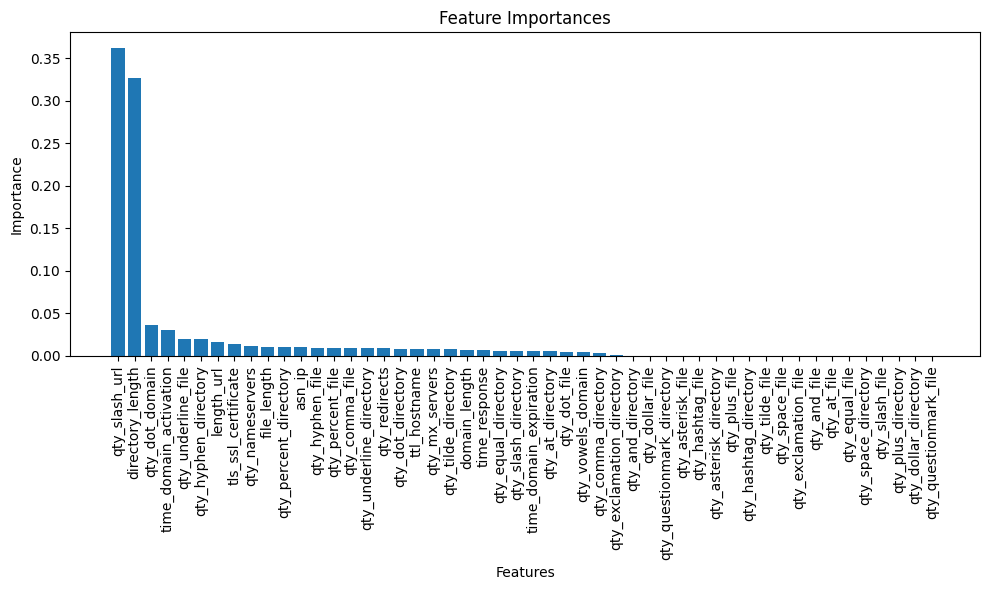

In [ ]:
#Visualizing feature importances
plt.figure(figsize=(10, 6))
plt.bar(feature_importances_xgb['feature'], feature_importances_xgb['importance'])
plt.xticks(rotation=90)
plt.xlabel('Features')
plt.ylabel('Importance')
plt.title('Feature Importances')
plt.tight_layout()
plt.show()

In [ ]:
#Optuna
# F1 scorer
f1_scorer = make_scorer(f1_score, average='weighted')

# Define objective functions for each model

def objective_xgb(trial):
    param = {
        'n_estimators': trial.suggest_int('n_estimators', 50, 300),
        'max_depth': trial.suggest_int('max_depth', 1, 10),
        'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
        'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
        'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0),
        'colsample_bylevel': trial.suggest_uniform('colsample_bylevel', 0.5, 1.0),
        'min_child_weight': trial.suggest_int('min_child_weight', 1, 10)
    }
    clf = XGBClassifier(**param)
    return cross_val_score(clf, X_train_xgb_selected, y_train, cv=3, n_jobs=-1, scoring=f1_scorer).mean()

# Optimize hyperparameters for each model

study_xgb = optuna.create_study(direction='maximize')
study_xgb.optimize(objective_xgb, n_trials=40)


print("Best XGBoost parameters: ", study_xgb.best_params)
print("Best XGBoost score: ", study_xgb.best_value)

# Train and evaluate the best models on the test set

best_xgb = XGBClassifier(**study_xgb.best_params).fit(X_train_xgb_selected, y_train)

print("Test F1 Score of XGBoost: ", f1_score(y_test, best_xgb.predict(X_test_xgb_selected), average='weighted'))

[I 2024-07-22 11:39:43,322] A new study created in memory with name: no-name-48a108ca-363c-49a9-9499-4ceea05edf13
<ipython-input-171-e31875046b5e>:10: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
<ipython-input-171-e31875046b5e>:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
<ipython-input-171-e31875046b5e>:12: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree

Best XGBoost parameters:  {'n_estimators': 216, 'max_depth': 10, 'learning_rate': 0.06392306616270445, 'subsample': 0.6198292491930842, 'colsample_bytree': 0.6891321647524842, 'colsample_bylevel': 0.9445612142662401, 'min_child_weight': 2}
Best XGBoost score:  0.9688989845396466
Test F1 Score of XGBoost:  0.9694324785832337


Best XGBoost parameters:  {'n_estimators': 216, 'max_depth': 10, 'learning_rate': 0.06392306616270445, 'subsample': 0.6198292491930842, 'colsample_bytree': 0.6891321647524842, 'colsample_bylevel': 0.9445612142662401, 'min_child_weight': 2}

Best XGBoost score:  0.9688989845396466

Test F1 Score of XGBoost:  0.9694324785832337

#Final classification report

In [ ]:
from sklearn.metrics import classification_report, accuracy_score, precision_score, recall_score, f1_score, confusion_matrix

# Best XGBoost parameters from Optuna
best_params = {
    'n_estimators': 216,
    'max_depth': 10,
    'learning_rate': 0.06392306616270445,
    'subsample': 0.6198292491930842,
    'colsample_bytree': 0.6891321647524842,
    'colsample_bylevel': 0.9445612142662401,
    'min_child_weight': 2
}

# Train the XGBoost model with the best parameters
best_xgb = XGBClassifier(**best_params)
best_xgb.fit(X_train_xgb_selected, y_train)

# Make predictions
y_pred_xgb = best_xgb.predict(X_test_xgb_selected)

# Calculate metrics
accuracy = accuracy_score(y_test, y_pred_xgb)
precision = precision_score(y_test, y_pred_xgb, average='weighted')
recall = recall_score(y_test, y_pred_xgb, average='weighted')
f1 = f1_score(y_test, y_pred_xgb, average='weighted')
conf_matrix = confusion_matrix(y_test, y_pred_xgb)
class_report = classification_report(y_test, y_pred_xgb)

# Print metrics
print("Accuracy: ", accuracy)
print("Precision: ", precision)
print("Recall: ", recall)
print("F1 Score: ", f1)
print("Confusion Matrix:\n", conf_matrix)
print("Classification Report:\n", class_report)


Accuracy:  0.9694224668424875
Precision:  0.969444579794264
Recall:  0.9694224668424875
F1 Score:  0.9694324785832337
Confusion Matrix:
 [[16604   413]
 [  387  8759]]
Classification Report:
               precision    recall  f1-score   support

           0       0.98      0.98      0.98     17017
           1       0.95      0.96      0.96      9146

    accuracy                           0.97     26163
   macro avg       0.97      0.97      0.97     26163
weighted avg       0.97      0.97      0.97     26163



##Pipeline

In [ ]:
from xgboost import XGBClassifier
import numpy as np
import pandas as pd
from sklearn.impute import IterativeImputer
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import VarianceThreshold
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
from sklearn.base import BaseEstimator, TransformerMixin

# Custom transformer for outlier capping using IQR method
class OutlierCapper:
    def __init__(self, factor=1.5):
        self.factor = factor

    def fit(self, X, y=None):
        # Compute quantiles and IQR
        self.quantiles_ = np.percentile(X, [25, 75], axis=0)
        self.iqr_ = self.quantiles_[1] - self.quantiles_[0]
        return self

    def transform(self, X):
        X_capped = X.copy()
        lower_bound = self.quantiles_[0] - self.factor * self.iqr_
        upper_bound = self.quantiles_[1] + self.factor * self.iqr_
        X_capped = np.where(X_capped < lower_bound, lower_bound, X_capped)
        X_capped = np.where(X_capped > upper_bound, upper_bound, X_capped)
        return X_capped

# Custom transformer for feature selection based on XGBoost feature importances
class FeatureSelector(BaseEstimator, TransformerMixin):
    def __init__(self, num_features=31):
        self.num_features = num_features

    def fit(self, X, y):
        # Convert X to DataFrame if it is not already
        if not isinstance(X, pd.DataFrame):
            X = pd.DataFrame(X)

        # Fit XGBoost model to get feature importances
        self.xgb_clf_ = XGBClassifier(n_estimators=216,
                                      max_depth=10,
                                      learning_rate=0.06392306616270445,
                                      subsample=0.6198292491930842,
                                      colsample_bytree=0.6891321647524842,
                                      colsample_bylevel=0.9445612142662401,
                                      min_child_weight=2)
        self.xgb_clf_.fit(X, y)
        importances = self.xgb_clf_.feature_importances_

        # Get feature importances and sort them
        feature_importances = pd.DataFrame({'feature': X.columns, 'importance': importances})
        feature_importances = feature_importances.sort_values(by='importance', ascending=False)

        # Select top features
        self.top_features_ = feature_importances['feature'].head(self.num_features).tolist()
        return self

    def transform(self, X):
        # Convert X to DataFrame if it is not already
        if not isinstance(X, pd.DataFrame):
            X = pd.DataFrame(X)

        return X[self.top_features_]

# Define the complete pipeline
pipeline = Pipeline(steps=[
    ('preprocessor', Pipeline(steps=[
        ('imputer', IterativeImputer()),
        ('outlier_capping', OutlierCapper(factor=1.5)),
        ('scaler', StandardScaler()),
        ('variance_threshold', VarianceThreshold(threshold=0.05))
    ])),
    ('feature_selector', FeatureSelector(num_features=31)),
    ('classifier', XGBClassifier(n_estimators=216,
                                max_depth=10,
                                learning_rate=0.06392306616270445,
                                subsample=0.6198292491930842,
                                colsample_bytree=0.6891321647524842,
                                colsample_bylevel=0.9445612142662401,
                                min_child_weight=2))
])

X = df.drop(columns='phishing')
y = df['phishing']

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Fit the pipeline
pipeline.fit(X_train, y_train)

# Make predictions
y_pred = pipeline.predict(X_test)

# Calculate metrics
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
conf_matrix = confusion_matrix(y_test, y_pred)
class_report = classification_report(y_test, y_pred)

# Print metrics
print("Accuracy: ", accuracy)
print("Precision: ", precision)
print("Recall: ", recall)
print("F1 Score: ", f1)
print("Confusion Matrix:\n", conf_matrix)
print("Classification Report:\n", class_report)


Accuracy:  0.9702251270878722
Precision:  0.9702511705447818
Recall:  0.9702251270878722
F1 Score:  0.9702366640195778
Confusion Matrix:
 [[16590   405]
 [  374  8794]]
Classification Report:
               precision    recall  f1-score   support

           0       0.98      0.98      0.98     16995
           1       0.96      0.96      0.96      9168

    accuracy                           0.97     26163
   macro avg       0.97      0.97      0.97     26163
weighted avg       0.97      0.97      0.97     26163



In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay,roc_curve, auc,roc_auc_score

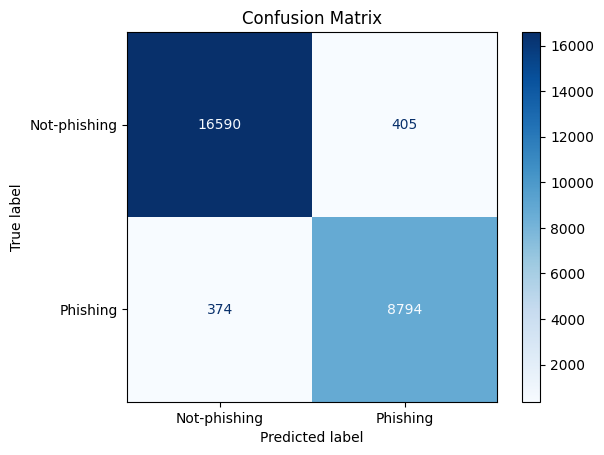

In [ ]:
# Compute the confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Display the confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Not-phishing', 'Phishing'])
disp.plot(cmap='Blues', values_format='d')
plt.title('Confusion Matrix')
plt.show()

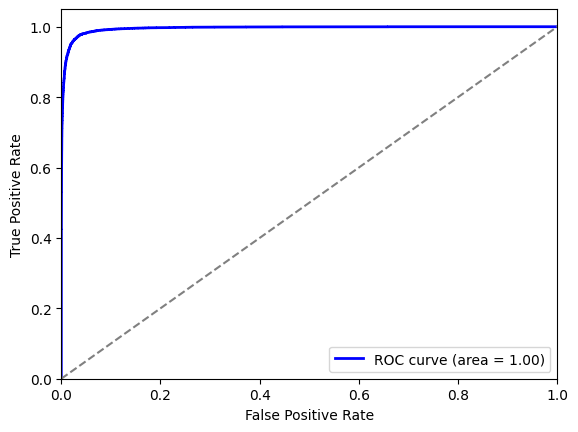

In [ ]:
#ROC-AUC curve
y_prob = pipeline.predict_proba(X_test)[:, 1]
fpr, tpr, _ = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc='lower right')
plt.show()

In [ ]:
#Checking ROC-AUC score
roc_auc_score(y_test, y_prob)

0.9950804010470178

In [ ]:
import joblib

In [ ]:
# Saving the pipeline to a .pkl file
with open('pipeline_phishing.pkl', 'wb') as f:
    joblib.dump(pipeline, f)